## In this notebook

since the spatial join in the other notbook not working we will ganna try to do the map in other way. we want to see how it ganna be after visulizing then we can find a soluation for the join error.

 (note: this work is not the final work we should enhance it then try to solve the model problems)

upload the data

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import pandas as pd

In [5]:
df_traffic = pd.read_csv('/content/drive/MyDrive/T5- final project/week 10/traffic_df_geometry.csv')
df_traffic.head()

,Datetime,Boro,Weekday_Weekend,Avg_Vol_Boro,Avg_Vol_Street,geometry
0,2012-01-07,Manhattan,Weekend,83.333333,111.5,POINT (1001191.6 247161.2)
1,2012-01-07,Manhattan,Weekend,83.333333,111.5,POINT (1001247.3 247436.8)
2,2012-01-07,Manhattan,Weekend,83.333333,27.0,POINT (1000999.7 247410.4)
3,2012-01-07,Manhattan,Weekend,75.666667,102.5,POINT (1001191.6 247161.2)
4,2012-01-07,Manhattan,Weekend,75.666667,102.5,POINT (1001247.3 247436.8)


In [8]:
df_traffic['Datetime'].min()

'2012-01-07'

In [10]:
df_traffic['Boro'].unique()

array(['Manhattan'], dtype=object)

In [11]:
df_traffic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4477412 entries, 0 to 4477411
Data columns (total 6 columns):
 #   Column           Dtype  
---  ------           -----  
 0   Datetime         object 
 1   Boro             object 
 2   Weekday_Weekend  object 
 3   Avg_Vol_Boro     float64
 4   Avg_Vol_Street   float64
 5   geometry         object 
dtypes: float64(2), object(4)
memory usage: 205.0+ MB


#### I will try to use `df_traffic_manh` because it has more features that may help me in visualization

In [40]:
df_traffic_manh = pd.read_csv('/content/drive/MyDrive/T5- final project/week 10/daily_volume_Manhattan_2012_2024.csv')
df_traffic_manh.head()

,Datetime,Boro,street,WktGeom,Vol,Weekday_Weekend,Avg_Vol_Boro,Avg_Vol_Street
0,2012-01-07,Manhattan,BROADWAY APPROACHING W 174TH ST,POINT (1001191.6 247161.2),102,Weekend,83.333333,111.5
1,2012-01-07,Manhattan,BROADWAY APPROACHING W 174TH ST,POINT (1001247.3 247436.8),121,Weekend,83.333333,111.5
2,2012-01-07,Manhattan,W 174TH ST APPROACHING BROADWAY,POINT (1000999.7 247410.4),27,Weekend,83.333333,27.0
3,2012-01-07,Manhattan,BROADWAY APPROACHING W 174TH ST,POINT (1001191.6 247161.2),94,Weekend,75.666667,102.5
4,2012-01-07,Manhattan,BROADWAY APPROACHING W 174TH ST,POINT (1001247.3 247436.8),111,Weekend,75.666667,102.5


In [41]:
df_traffic_manh.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4477412 entries, 0 to 4477411
Data columns (total 8 columns):
 #   Column           Dtype  
---  ------           -----  
 0   Datetime         object 
 1   Boro             object 
 2   street           object 
 3   WktGeom          object 
 4   Vol              int64  
 5   Weekday_Weekend  object 
 6   Avg_Vol_Boro     float64
 7   Avg_Vol_Street   float64
dtypes: float64(2), int64(1), object(5)
memory usage: 273.3+ MB


In [42]:
df_traffic_manh['Datetime'].min()

'2012-01-07'

In [43]:
df_traffic_manh['Boro'].unique() # all boro is manhanttan

array(['Manhattan'], dtype=object)

pre processing

In [44]:
# drop street and Boro, since all the boro is manhanttan, check then drop duplicate or null if there any , change the name of WktGeom in to geometry

In [45]:
df_traffic_manh = df_traffic_manh.drop(['street', 'Boro'], axis=1)
df_traffic_manh.head()

,Datetime,WktGeom,Vol,Weekday_Weekend,Avg_Vol_Boro,Avg_Vol_Street
0,2012-01-07,POINT (1001191.6 247161.2),102,Weekend,83.333333,111.5
1,2012-01-07,POINT (1001247.3 247436.8),121,Weekend,83.333333,111.5
2,2012-01-07,POINT (1000999.7 247410.4),27,Weekend,83.333333,27.0
3,2012-01-07,POINT (1001191.6 247161.2),94,Weekend,75.666667,102.5
4,2012-01-07,POINT (1001247.3 247436.8),111,Weekend,75.666667,102.5


In [46]:
#check
print(f"Number of duplicate rows: {df_traffic_manh.duplicated().sum()}")
print(f"Number of null values in each column:\n{df_traffic_manh.isnull().sum()}")

# Drop
df_traffic_manh = df_traffic_manh.drop_duplicates().dropna()


Number of duplicate rows: 24433
Number of null values in each column:
Datetime           0
WktGeom            0
Vol                0
Weekday_Weekend    0
Avg_Vol_Boro       0
Avg_Vol_Street     0
dtype: int64


In [47]:
df_traffic_manh = df_traffic_manh.rename(columns={'WktGeom': 'geometry'}) #just to make it more organize

In [ ]:
#Now i will convert it in to geo pandas format

In [48]:
df_traffic_manh.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4452979 entries, 0 to 4477411
Data columns (total 6 columns):
 #   Column           Dtype  
---  ------           -----  
 0   Datetime         object 
 1   geometry         object 
 2   Vol              int64  
 3   Weekday_Weekend  object 
 4   Avg_Vol_Boro     float64
 5   Avg_Vol_Street   float64
dtypes: float64(2), int64(1), object(3)
memory usage: 237.8+ MB


In [64]:
import geopandas as gpd
from shapely import wkt

# Convert 'geometry' column to WKT (Well-Known Text) if needed
df_traffic_manh['geometry'] = df_traffic_manh['geometry'].apply(wkt.loads)

# Create a GeoDataFrame
gdf = gpd.GeoDataFrame(df_traffic_manh, geometry='geometry', crs='EPSG:2263')

# Set the coordinate reference system (CRS) if not already set
gdf.set_crs(epsg=2263, inplace=True)  # Assuming WGS 84 CRS


In [62]:
gdf.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [65]:
# convert the type of Datetime col

df_traffic_manh['Datetime'] = pd.to_datetime(df_traffic_manh['Datetime'])

## 2. I will try to Visualize the Traffic data on the map

for specific date

In [66]:
# Filter the data for the specific date '2016-03-03'
filtered_df = df_traffic_manh[df_traffic_manh['Datetime'] == '2016-03-03']

# Now, convert the filtered DataFrame to a GeoDataFrame
gdf = gpd.GeoDataFrame(filtered_df, geometry='geometry', crs='EPSG:2263')

In [67]:
filtered_df

,Datetime,geometry,Vol,Weekday_Weekend,Avg_Vol_Boro,Avg_Vol_Street
2657512,2016-03-03,POINT (982787.1 202093.1),198,Weekday,143.857143,330.000000
2657513,2016-03-03,POINT (982952.7 203012.5),171,Weekday,143.857143,330.000000
2657514,2016-03-03,POINT (983422.4 204511.6),320,Weekday,143.857143,330.000000
2657515,2016-03-03,POINT (985056.3 207790.8),395,Weekday,143.857143,330.000000
2657516,2016-03-03,POINT (986176.6 209815.6),414,Weekday,143.857143,330.000000
...,...,...,...,...,...,...
2660771,2016-03-03,POINT (998646.8 228023.1),32,Weekday,160.800000,79.684211
2660772,2016-03-03,POINT (998710.7 228307.8),23,Weekday,160.800000,79.684211
2660773,2016-03-03,POINT (999933.5 230344.8),13,Weekday,160.800000,79.684211
2660774,2016-03-03,POINT (999996.6 230635.5),15,Weekday,160.800000,79.684211


In [79]:
import folium
import geopandas as gpd

# Step 1: Ensure filtered_df is a GeoDataFrame
gdf = gpd.GeoDataFrame(filtered_df, geometry='geometry')

# Step 2: Set CRS to EPSG:2263 if not already set
if gdf.crs is None:
    gdf.set_crs(epsg=2263, inplace=True)  # Setting CRS to EPSG:2263 (New York State Plane)

# Step 3: Reproject the data to EPSG:4326 for Folium visualization
gdf = gdf.to_crs(epsg=4326)

# Step 4: Calculate the centroid for map centering
map_center = gdf.geometry.centroid.iloc[0]

# Step 5: Create a Folium map centered on the centroid
m = folium.Map(location=[map_center.y, map_center.x], zoom_start=12)

# Step 6: Visualize each geometry on the map
for _, row in gdf.iterrows():
    geom = row.geometry

    # If the geometry is a Point
    if geom.geom_type == 'Point':
        folium.Marker(
            location=[geom.y, geom.x],
            popup=f"Volume: {row['Vol']}, Avg Vol (Boro): {row['Avg_Vol_Boro']}, Avg Vol (Street): {row['Avg_Vol_Street']}"
        ).add_to(m)

    # If the geometry is a Polygon or MultiPolygon
    elif geom.geom_type in ['Polygon', 'MultiPolygon']:
        folium.GeoJson(
            geom,
            style_function=lambda x: {'fillColor': 'blue', 'color': 'blue', 'fillOpacity': 0.5},
            popup=f"Volume: {row['Vol']}, Avg Vol (Boro): {row['Avg_Vol_Boro']}, Avg Vol (Street): {row['Avg_Vol_Street']}"
        ).add_to(m)

    # If the geometry is a LineString (or MultiLineString)
    elif geom.geom_type in ['LineString', 'MultiLineString']:
        folium.PolyLine(
            locations=[(point.y, point.x) for point in geom.coords],
            color="blue",
            weight=2.5,
            opacity=1
        ).add_to(m)

# Step 7: Display the map
m


<ipython-input-79-bcbd4e841ed0>:15: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  map_center = gdf.geometry.centroid.iloc[0]


هنا حدد لي نقاط الترافيك بس ما بأفهم منها شيء اذا لازم اضغط على كل وحده عشان أشوف كم الترافك فليوم، لذا بأحطهم بالألوان أو ممكن محطهم كدائرة تكبر وتصغر



---



هذي الحسابات عشان أعرف على اي أساس ألون الزحمة، استبعدت الاوت لير من الرينج عشان ما تخرب علي، في هذا اليوم ما يفرق مره لكن لو على بيانات ضخمة بتفرق

In [81]:
# i want to change the colour of the point depend on volume
filtered_df['Vol'].describe()

,Vol
count,3262.000000
mean,176.291845
std,134.982478
min,0.000000
25%,58.000000
50%,154.000000
75%,266.000000
max,698.000000


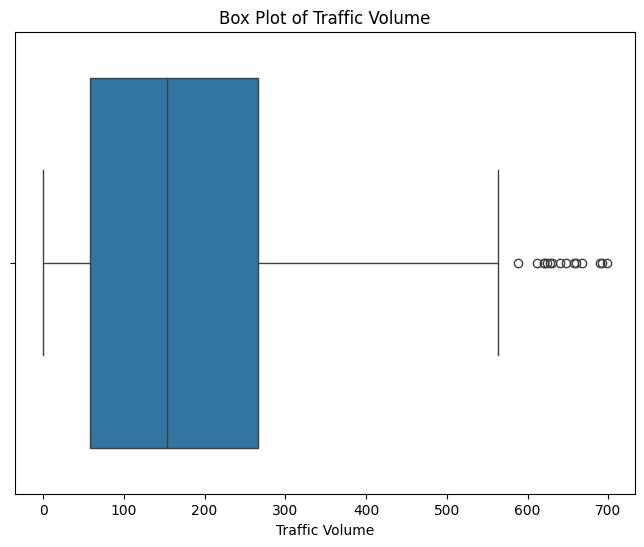

In [84]:

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.boxplot(x=filtered_df['Vol'])
plt.title('Box Plot of Traffic Volume')
plt.xlabel('Traffic Volume')
plt.show()


In [86]:
Q1 = filtered_df['Vol'].quantile(0.25)
Q3 = filtered_df['Vol'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = filtered_df[(filtered_df['Vol'] < lower_bound) | (filtered_df['Vol'] > upper_bound)]

print("Outliers:")
outliers


Outliers:


,Datetime,geometry,Vol,Weekday_Weekend,Avg_Vol_Boro,Avg_Vol_Street
2658688,2016-03-03,POINT (992651.6 217358.4),588,Weekday,211.628571,188.315789
2658756,2016-03-03,POINT (992651.6 217358.4),630,Weekday,216.828571,193.157895
2658790,2016-03-03,POINT (992651.6 217358.4),620,Weekday,213.828571,189.052632
2659912,2016-03-03,POINT (992651.6 217358.4),648,Weekday,227.028571,213.736842
2659946,2016-03-03,POINT (992651.6 217358.4),668,Weekday,236.171429,221.263158
2659980,2016-03-03,POINT (992651.6 217358.4),640,Weekday,233.600000,214.000000
2660014,2016-03-03,POINT (992651.6 217358.4),628,Weekday,235.857143,215.842105
2660048,2016-03-03,POINT (992651.6 217358.4),692,Weekday,238.771429,211.684211
2660082,2016-03-03,POINT (992651.6 217358.4),660,Weekday,237.000000,207.894737
2660116,2016-03-03,POINT (992651.6 217358.4),698,Weekday,230.942857,205.421053


In [94]:
Q2 = filtered_df['Vol'].quantile(0.50)

print('The first quarter of the Traffic volume = ', Q1)
print('The second quarter of the Traffic volume = ', Q2)
print('The third quarter of the Traffic volume = ', Q3)

The first quarter of the Traffic volume =  58.0
The second quarter of the Traffic volume =  154.0
The third quarter of the Traffic volume =  266.0


- Low traffic volume (0 to 58): Green
- Medium traffic volume (58 to 154): Orange
- High traffic volume (154 and above): Red

I'm not sure if this is good or not, i think for visaluzing is fine but for predict is not

تتكلم عن يوم واحد `filtered_df` اتوقع هذا ما ينفع مره لان

 الاحسن ان يتم حسابه على جميع السنوات



---



In [95]:

# Step 5: Create a color function based on traffic volume categories
def get_color(volume):
    if volume <= 58:
        return 'green'  # Low traffic
    elif 58 < volume <= 154:
        return 'orange'  # Medium traffic
    else:
        return 'red'  # High traffic

# Step 6: Create a Folium map centered on the centroid
m = folium.Map(location=[map_center.y, map_center.x], zoom_start=12)

# Step 7: Visualize each geometry on the map with color based on traffic volume
for _, row in gdf.iterrows():
    geom = row.geometry
    color = get_color(row['Vol'])  # Get the color based on traffic volume

    # If the geometry is a Point
    if geom.geom_type == 'Point':
        folium.CircleMarker(
            location=[geom.y, geom.x],
            radius=5,  # You can adjust the size of the marker here
            color=color,  # Use the color based on traffic volume
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            popup=f"Volume: {row['Vol']}, Avg Vol (Boro): {row['Avg_Vol_Boro']}, Avg Vol (Street): {row['Avg_Vol_Street']}"
        ).add_to(m)

# Step 8: Display the map
m


**Locate a selected project on the map(World Trade Center Oculus, opening date equal the date of filterd_df which is 2016-03-03)**

In [96]:
import folium
import geopandas as gpd
from shapely.geometry import Point

# Step 1: Create the "World Trade Center Oculus" point in EPSG:2263
oculus_point_2263 = Point(981061.8731495156, 198896.1066752608)

# Step 2: Convert this point to a GeoDataFrame
oculus_gdf = gpd.GeoDataFrame(geometry=[oculus_point_2263], crs="EPSG:2263")

# Step 3: Reproject the point to EPSG:4326 (for Folium)
oculus_gdf = oculus_gdf.to_crs(epsg=4326)

# Step 4: Get the transformed point's coordinates
oculus_point_4326 = oculus_gdf.geometry.iloc[0]
oculus_lat, oculus_lon = oculus_point_4326.y, oculus_point_4326.x

# Step 5: Create the Folium map (assuming you already have a base map from previous code)
# If no base map exists, you can create it like this:
map_center = [oculus_lat, oculus_lon]
m = folium.Map(location=map_center, zoom_start=15)

# Step 6: Add the "World Trade Center Oculus" point to the map
folium.Marker(
    location=[oculus_lat, oculus_lon],
    popup="World Trade Center Oculus",
    icon=folium.Icon(color='blue', icon='info-sign')
).add_to(m)

# Step 7: Display the map
m


**The traffic volume for selected date with project location **

In [98]:
from shapely.geometry import Point

gdf = gpd.GeoDataFrame(filtered_df, geometry='geometry')

if gdf.crs is None:
    gdf.set_crs(epsg=2263, inplace=True)
gdf = gdf.to_crs(epsg=4326)

map_center = gdf.geometry.centroid.iloc[0]


### project point ###
oculus_point_2263 = Point(981061.8731495156, 198896.1066752608)
oculus_gdf = gpd.GeoDataFrame(geometry=[oculus_point_2263], crs="EPSG:2263")
oculus_gdf = oculus_gdf.to_crs(epsg=4326)
oculus_point_4326 = oculus_gdf.geometry.iloc[0]
oculus_lat, oculus_lon = oculus_point_4326.y, oculus_point_4326.x


# Step 5: Create a color function based on traffic volume categories
def get_color(volume):
    if volume <= 58:
        return 'green'  # Low traffic
    elif 58 < volume <= 154:
        return 'orange'  # Medium traffic
    else:
        return 'red'  # High traffic

# Step 6: Create a Folium map centered on the centroid
m = folium.Map(location=[map_center.y, map_center.x], zoom_start=12)


#Add the "World Trade Center Oculus" point to the map
folium.Marker(
    location=[oculus_lat, oculus_lon],
    popup="World Trade Center Oculus",
    icon=folium.Icon(color='blue', icon='info-sign')
).add_to(m)

# Step 7: Visualize each geometry on the map with color based on traffic volume
for _, row in gdf.iterrows():
    geom = row.geometry
    color = get_color(row['Vol'])  # Get the color based on traffic volume

    # If the geometry is a Point
    if geom.geom_type == 'Point':
        folium.CircleMarker(
            location=[geom.y, geom.x],
            radius=5,  # You can adjust the size of the marker here
            color=color,  # Use the color based on traffic volume
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            popup=f"Volume: {row['Vol']}, Avg Vol (Boro): {row['Avg_Vol_Boro']}, Avg Vol (Street): {row['Avg_Vol_Street']}"
        ).add_to(m)



# Display the map
m


<ipython-input-98-f3f8dd7e156b>:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  map_center = gdf.geometry.centroid.iloc[0]


## OVER ALL, this is not adding anything to our project, that only help us how we want the final output be like .

## 3. try to make interactive map include many years and all the projects